# PTDS2403 - Regression

### Project Title: Data Science Regression Project
#### Done By: David Harrison

© ExploreAI 2024

---

## Table of Contents

<a href=#BC> Background Context</a>

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Data Collection and Description</a>

<a href=#three>3. Loading Data </a>

<a href=#four>4. Data Cleaning and Filtering</a>

<a href=#five>5. Exploratory Data Analysis (EDA)</a>

<a href=#six>6. Modeling </a>

<a href=#seven>7. Evaluation and Validation</a>

<a href=#eight>8. Final Model</a>

<a href=#nine>9. Conclusion and Future Work</a>

<a href=#ten>10. References</a>

---
 <a id="BC"></a>
## 1.  Background Context
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Introduce the project, outline its goals, and explain its significance.
* **Details:** Include information about the problem domain, the specific questions or challenges the project aims to address, and any relevant background information that sets the stage for the work.



<a href=#one></a>
## 2.  Importing Packages
<a href=#cont>Back to Table of Contents</a>


Various libraries and packages are imported in order to do data analysis (Numpy, Pandas), and visualisations (Matplotlib, Seaborn)

In [2]:
# Libraries for data loading, manipulation and analysis

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.formula.api as smf
import statsmodels.graphics.correlation as sgc
from statsmodels.graphics.gofplots import qqplot
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import OLSInfluence


---
<a href=#two></a>
## 3.  Data Collection and Description
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Describe how the data was collected and provide an overview of its characteristics.
* **Details:** Mention sources of the data, the methods used for collection (e.g., APIs, web scraping, datasets from repositories), and a general description of the dataset including size, scope, and types of data available (e.g., numerical, categorical).


In [ ]:
#Please use code cells to code in and do not forget to comment your code.

---
<a href=#three></a>
## 4. Loading Data
<a href=#cont>Back to Table of Contents</a>

The data used for this project was located in the `co2_emissions_from_agri.csv` file. To better manipulate and analyse the `co2_emissions_from_agri.csv` file, it was loaded into a Pandas Data Frame using the Pandas function, `.read_csv()` and referred to as `df`. For demonstrating the column index in the dataframe , `index_col=False` was implemented.

In [3]:
#Loading Dataset
df = pd.read_csv("co2_emissions_from_agri.csv", index_col=False)
df.head() 

,Area,Year,Savanna fires,Forest fires,Crop Residues,Rice Cultivation,Drained organic soils (CO2),Pesticides Manufacturing,Food Transport,Forestland,...,Manure Management,Fires in organic soils,Fires in humid tropical forests,On-farm energy use,Rural population,Urban population,Total Population - Male,Total Population - Female,total_emission,Average Temperature °C
0,Afghanistan,1990,14.7237,0.0557,205.6077,686.00,0.0,11.807483,63.1152,-2388.803,...,319.1763,0.0,0.0,NaN,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539,0.536167
1,Afghanistan,1991,14.7237,0.0557,209.4971,678.16,0.0,11.712073,61.2125,-2388.803,...,342.3079,0.0,0.0,NaN,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629,0.020667
2,Afghanistan,1992,14.7237,0.0557,196.5341,686.00,0.0,11.712073,53.3170,-2388.803,...,349.1224,0.0,0.0,NaN,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229,-0.259583
3,Afghanistan,1993,14.7237,0.0557,230.8175,686.00,0.0,11.712073,54.3617,-2388.803,...,352.2947,0.0,0.0,NaN,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529,0.101917
4,Afghanistan,1994,14.7237,0.0557,242.0494,705.60,0.0,11.712073,53.9874,-2388.803,...,367.6784,0.0,0.0,NaN,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729,0.372250


<div class="alert alert-block alert-danger">
<b>To prevent any major unnecessary changes occurring to the original data</b> , a copy of the dataframe was made using the df.copy() method and referred to as `df_copy`.
</div>

In [4]:
# Make a copy of the dataframe
df_copy = df.copy()

---
<a href=#four></a>
## 5.  Data Cleaning and Filtering
<a href=#cont>Back to Table of Contents</a>



Look at the shape of the dataframe using `.shape`.

In [5]:
# Displays the number of rows and columns
df_copy.shape

(6965, 31)

**Results:**  the dataset has 6965 rows and 31 columns

One of the univariate analysis (non-graphical), is the method `.info()`. This method outputs important details about the dataset which includes the columns: the data types **(Dtype)** of the columns and the count of non-null values.

In [6]:
## Display summary information about the DataFrame.
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6965 entries, 0 to 6964
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Area                             6965 non-null   object 
 1   Year                             6965 non-null   int64  
 2   Savanna fires                    6934 non-null   float64
 3   Forest fires                     6872 non-null   float64
 4   Crop Residues                    5576 non-null   float64
 5   Rice Cultivation                 6965 non-null   float64
 6   Drained organic soils (CO2)      6965 non-null   float64
 7   Pesticides Manufacturing         6965 non-null   float64
 8   Food Transport                   6965 non-null   float64
 9   Forestland                       6472 non-null   float64
 10  Net Forest conversion            6472 non-null   float64
 11  Food Household Consumption       6492 non-null   float64
 12  Food Retail         

**Results**:  Area column is of type object.  Year column is of type integer.  The remaining columns of of type float.

**There are null values, replace with zeros**
it was decided to replace nulls with zeros, because on analysis in excel the sum of all emission columns was equal to total emissions, so transforming nulls to zeros should not affect outcomes.

In [7]:
df_copy.fillna(0, inplace=True)
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6965 entries, 0 to 6964
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Area                             6965 non-null   object 
 1   Year                             6965 non-null   int64  
 2   Savanna fires                    6965 non-null   float64
 3   Forest fires                     6965 non-null   float64
 4   Crop Residues                    6965 non-null   float64
 5   Rice Cultivation                 6965 non-null   float64
 6   Drained organic soils (CO2)      6965 non-null   float64
 7   Pesticides Manufacturing         6965 non-null   float64
 8   Food Transport                   6965 non-null   float64
 9   Forestland                       6965 non-null   float64
 10  Net Forest conversion            6965 non-null   float64
 11  Food Household Consumption       6965 non-null   float64
 12  Food Retail         

Check for duplicate rows in the dataframe.


In [8]:
duplicate_count = df_copy.duplicated().sum()
print('Number of Duplicate Rows:',duplicate_count)

Number of Duplicate Rows: 0


Upon investigating the data it was discovered that the rows for China are duplicated.  A total row for China and then subtotals for the different regions in China:  

In [9]:
china_filter = {'China','China, Hong Kong SAR','China, Macao SAR','China, mainland','China, Taiwan Province of'}
year_2020 = df_copy['Year'] == 2020
china = df_copy[df_copy['Area'].isin(china_filter) & year_2020 ]
china

,Area,Year,Savanna fires,Forest fires,Crop Residues,Rice Cultivation,Drained organic soils (CO2),Pesticides Manufacturing,Food Transport,Forestland,...,Manure Management,Fires in organic soils,Fires in humid tropical forests,On-farm energy use,Rural population,Urban population,Total Population - Male,Total Population - Female,total_emission,Average Temperature °C
1324,China,2020,163.8876,603.8159,33490.0741,149256.66250,3916.9002,8525.0,40641.4559,-651765.3001,...,60419.0966,0.0,0.0,123159.8608,554487938.0,902077760.0,743586579.0,713341908.0,3.115114e+06,1.574000
1355,"China, Hong Kong SAR",2020,0.0000,0.0000,0.0000,0.00000,0.0000,2.0,853.6742,0.0000,...,28.5071,0.0,0.0,0.0000,0.0,7547652.0,3462186.0,4038771.0,1.387787e+04,1.757833
1386,"China, Macao SAR",2020,0.0000,0.0000,0.0000,764.89281,0.0000,1.0,52.6209,0.0000,...,0.7746,0.0,0.0,26.2588,0.0,651875.0,317655.0,358628.0,3.637688e+03,1.757833
1417,"China, mainland",2020,163.8876,603.8159,33384.8108,147922.61120,3916.9002,8210.0,35648.7214,-651765.3001,...,59298.4815,0.0,0.0,121510.5493,549472347.0,875075919.0,727993760.0,696936022.0,3.039089e+06,1.573417
1448,"China, Taiwan Province of",2020,0.0000,0.0000,105.2633,1334.05130,0.0000,313.0,4086.4396,0.0000,...,1091.3334,0.0,0.0,1623.0499,5015591.0,18802314.0,11812978.0,12008487.0,6.740693e+04,1.673250


Filter out the various China sub areas to leave only China in the dataframe.

In [10]:
china_filter = {'China, Hong Kong SAR','China, Macao SAR','China, mainland','China, Taiwan Province of'}
filtered_data = df_copy[~df_copy['Area'].isin(china_filter)]
filtered_data.head()

,Area,Year,Savanna fires,Forest fires,Crop Residues,Rice Cultivation,Drained organic soils (CO2),Pesticides Manufacturing,Food Transport,Forestland,...,Manure Management,Fires in organic soils,Fires in humid tropical forests,On-farm energy use,Rural population,Urban population,Total Population - Male,Total Population - Female,total_emission,Average Temperature °C
0,Afghanistan,1990,14.7237,0.0557,205.6077,686.00,0.0,11.807483,63.1152,-2388.803,...,319.1763,0.0,0.0,0.0,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539,0.536167
1,Afghanistan,1991,14.7237,0.0557,209.4971,678.16,0.0,11.712073,61.2125,-2388.803,...,342.3079,0.0,0.0,0.0,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629,0.020667
2,Afghanistan,1992,14.7237,0.0557,196.5341,686.00,0.0,11.712073,53.3170,-2388.803,...,349.1224,0.0,0.0,0.0,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229,-0.259583
3,Afghanistan,1993,14.7237,0.0557,230.8175,686.00,0.0,11.712073,54.3617,-2388.803,...,352.2947,0.0,0.0,0.0,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529,0.101917
4,Afghanistan,1994,14.7237,0.0557,242.0494,705.60,0.0,11.712073,53.9874,-2388.803,...,367.6784,0.0,0.0,0.0,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729,0.372250


Check the shape of the dataframe to see if the rows have been filtered out.

In [11]:
filtered_data.shape

(6841, 31)

**Results:** the number of rows have dropped from 6965 to 6841, (124 rows = 31 years x 4 areas)

Rename column headings according to PEP8 conventions

In [12]:
new_column_names = {
                    'Savanna fires': 'Fire_Savanna',
                    'Forest fires': 'Fire_Forest',
                    'Crop Residues': 'Crop_Residues',
                    'Rice Cultivation': 'Rice_Cultivation',
                    'Drained organic soils (CO2)': 'Drained_Organic_Soils',
                    'Pesticides Manufacturing': 'Pesticides_Manuf',
                    'Food Transport': 'Food_Transport',
                    'Net Forest conversion': 'Net_Forest_Conversion',
                    'Food Household Consumption': 'Food_Consumption',
                    'Food Retail': 'Food_Retail',
                    'On-farm Electricity Use': 'Farm_Electricity',
                    'Food Packaging': 'Food_Packaging',
                    'Agrifood Systems Waste Disposal': 'Agrifood_Waste_Disposal',
                    'Food Processing': 'Food_Processing',
                    'Fertilizers Manufacturing': 'Fertilizer_Manuf',
                    'Manure applied to Soils': 'Manure_Soil',
                    'Manure left on Pasture': 'Manure_Pasture',
                    'Manure Management': 'Manure_Mngt',
                    'Fires in organic soils': 'Fire_Organic_Soil',
                    'Fires in humid tropical forests': 'Fire_Trop_Forest',
                    'On-farm energy use': 'Farm_Energy_Use',
                    'Rural population': 'Population_Rural',
                    'Urban population':'Population_Urban',
                    'Total Population - Male': 'Population_Male',
                    'Total Population - Female': 'Population_Female',
                    'total_emission': 'Total_Emission',
                    'Average Temperature °C': 'Ave_Temp_Change'}
filtered_data = filtered_data.rename(columns=new_column_names)
filtered_data.head()

,Area,Year,Fire_Savanna,Fire_Forest,Crop_Residues,Rice_Cultivation,Drained_Organic_Soils,Pesticides_Manuf,Food_Transport,Forestland,...,Manure_Mngt,Fire_Organic_Soil,Fire_Trop_Forest,Farm_Energy_Use,Population_Rural,Population_Urban,Population_Male,Population_Female,Total_Emission,Ave_Temp_Change
0,Afghanistan,1990,14.7237,0.0557,205.6077,686.00,0.0,11.807483,63.1152,-2388.803,...,319.1763,0.0,0.0,0.0,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539,0.536167
1,Afghanistan,1991,14.7237,0.0557,209.4971,678.16,0.0,11.712073,61.2125,-2388.803,...,342.3079,0.0,0.0,0.0,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629,0.020667
2,Afghanistan,1992,14.7237,0.0557,196.5341,686.00,0.0,11.712073,53.3170,-2388.803,...,349.1224,0.0,0.0,0.0,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229,-0.259583
3,Afghanistan,1993,14.7237,0.0557,230.8175,686.00,0.0,11.712073,54.3617,-2388.803,...,352.2947,0.0,0.0,0.0,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529,0.101917
4,Afghanistan,1994,14.7237,0.0557,242.0494,705.60,0.0,11.712073,53.9874,-2388.803,...,367.6784,0.0,0.0,0.0,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729,0.372250


Create a dataframe of areas grouped by region

In [13]:
region_mapped = pd.read_excel('RegionsMapped.xlsx', sheet_name='regionstable')
region_mapped.head()

,Area,Region
0,Australia,Australia and New Zealand
1,New Zealand,Australia and New Zealand
2,Anguilla,Caribbean
3,Antigua and Barbuda,Caribbean
4,Aruba,Caribbean


In [14]:
merged_filtered_data = filtered_data.merge(region_mapped, on='Area', how='left')
merged_filtered_data.head()

,Area,Year,Fire_Savanna,Fire_Forest,Crop_Residues,Rice_Cultivation,Drained_Organic_Soils,Pesticides_Manuf,Food_Transport,Forestland,...,Fire_Organic_Soil,Fire_Trop_Forest,Farm_Energy_Use,Population_Rural,Population_Urban,Population_Male,Population_Female,Total_Emission,Ave_Temp_Change,Region
0,Afghanistan,1990,14.7237,0.0557,205.6077,686.00,0.0,11.807483,63.1152,-2388.803,...,0.0,0.0,0.0,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539,0.536167,Southern Asia
1,Afghanistan,1991,14.7237,0.0557,209.4971,678.16,0.0,11.712073,61.2125,-2388.803,...,0.0,0.0,0.0,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629,0.020667,Southern Asia
2,Afghanistan,1992,14.7237,0.0557,196.5341,686.00,0.0,11.712073,53.3170,-2388.803,...,0.0,0.0,0.0,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229,-0.259583,Southern Asia
3,Afghanistan,1993,14.7237,0.0557,230.8175,686.00,0.0,11.712073,54.3617,-2388.803,...,0.0,0.0,0.0,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529,0.101917,Southern Asia
4,Afghanistan,1994,14.7237,0.0557,242.0494,705.60,0.0,11.712073,53.9874,-2388.803,...,0.0,0.0,0.0,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729,0.372250,Southern Asia


In [15]:
merged_filtered_data.shape

(6841, 32)

In [16]:
print(merged_filtered_data.columns)

Index(['Area', 'Year', 'Fire_Savanna', 'Fire_Forest', 'Crop_Residues',
       'Rice_Cultivation', 'Drained_Organic_Soils', 'Pesticides_Manuf',
       'Food_Transport', 'Forestland', 'Net_Forest_Conversion',
       'Food_Consumption', 'Food_Retail', 'Farm_Electricity', 'Food_Packaging',
       'Agrifood_Waste_Disposal', 'Food_Processing', 'Fertilizer_Manuf',
       'IPPU', 'Manure_Soil', 'Manure_Pasture', 'Manure_Mngt',
       'Fire_Organic_Soil', 'Fire_Trop_Forest', 'Farm_Energy_Use',
       'Population_Rural', 'Population_Urban', 'Population_Male',
       'Population_Female', 'Total_Emission', 'Ave_Temp_Change', 'Region'],
      dtype='object')


In [18]:
group_by_region = merged_filtered_data.drop('Area',axis=1)
group_by_region = group_by_region.groupby(['Year','Region']).agg(
    Fire_Savanna=('Fire_Savanna', 'sum'),
    Fire_Forest=('Fire_Forest', 'sum'),
    Crop_Residues=('Crop_Residues', 'sum'),
    Rice_Cultivation=('Rice_Cultivation', 'sum'),
    Drained_Organic_Soils=('Drained_Organic_Soils', 'sum'),
    Pesticides_Manuf=('Pesticides_Manuf', 'sum'),
    Food_Transport=('Food_Transport', 'sum'),
    Forestland=('Forestland', 'sum'),
    Net_Forest_Conversion=('Net_Forest_Conversion', 'sum'),
    Food_Consumption=('Food_Consumption', 'sum'),
    Food_Retail=('Food_Retail', 'sum'),
    Farm_Electricity=('Farm_Electricity', 'sum'),
    Food_Packaging=('Food_Packaging', 'sum'),  
    Agrifood_Waste_Disposal=('Agrifood_Waste_Disposal', 'sum'),
    Food_Processing=('Food_Processing', 'sum'),
    Fertilizer_Manuf=('Fertilizer_Manuf', 'sum'),
    IPPU=('IPPU', 'sum'),
    Manure_Soil=('Manure_Soil', 'sum'),
    Manure_Pasture=('Manure_Pasture', 'sum'),
    Manure_Mngt=('Manure_Mngt', 'sum'),
    Fire_Organic_Soil=('Fire_Organic_Soil', 'sum'),
    Fire_Trop_Forest=('Fire_Trop_Forest', 'sum'),
    Farm_Energy_Use=('Farm_Energy_Use', 'sum'),
    Population_Rural=('Population_Rural', 'sum'),
    Population_Urban=('Population_Urban', 'sum'),
    Population_Male=('Population_Male', 'sum'),
    Population_Female=('Population_Female', 'sum'),
    Total_Emission=('Total_Emission', 'sum'),
    Ave_Temp_Change=('Ave_Temp_Change', 'mean')
).reset_index()
group_by_region.head()

,Year,Region,Fire_Savanna,Fire_Forest,Crop_Residues,Rice_Cultivation,Drained_Organic_Soils,Pesticides_Manuf,Food_Transport,Forestland,...,Manure_Mngt,Fire_Organic_Soil,Fire_Trop_Forest,Farm_Energy_Use,Population_Rural,Population_Urban,Population_Male,Population_Female,Total_Emission,Ave_Temp_Change
0,1990,Australia and New Zealand,54273.6186,4242.5679,1661.9614,1477.132092,5243.4883,892.000000,7777.100800,-38755.9564,...,9030.8767,0.0,144.6461,5378.8451,3000938.0,17438665.0,10174408.0,10270985.0,2.091653e+05,0.624042
1,1990,Caribbean,72.5117,119.8989,111.2207,29639.715549,313.8347,702.345194,3925.423772,-19726.3254,...,792.8496,0.0,90.3251,7529.5288,13835273.0,20402001.0,16991319.0,17183128.0,1.587023e+05,0.451203
2,1990,Central America,1173.4700,3556.8305,1784.5149,491.865700,999.8331,981.000000,10420.251900,-2060.9854,...,4134.1166,0.0,2175.9629,5712.3778,40116295.0,74614825.0,54911744.0,56332508.0,2.604771e+05,0.444417
3,1990,Eastern Africa,46804.0727,46139.9904,1744.5298,15082.967434,40350.0049,240.170302,1236.817900,-8904.0460,...,5298.5015,0.0,27626.4300,2534.9205,157677983.0,34588891.0,94548695.0,97025581.0,5.035334e+05,0.337115
4,1990,Eastern Asia,809.8757,1122.6974,25707.6554,187606.128177,31477.6423,8375.885987,43454.286200,-478420.0968,...,58997.8651,0.0,1.8252,123029.8439,918133356.0,470664827.0,695847221.0,675399323.0,1.055111e+06,1.192083


In [19]:
group_by_region.shape

(680, 31)

In [20]:
group_by_region_numeric = group_by_region.select_dtypes(include=['number'])
group_by_region_numeric.head()

,Year,Fire_Savanna,Fire_Forest,Crop_Residues,Rice_Cultivation,Drained_Organic_Soils,Pesticides_Manuf,Food_Transport,Forestland,Net_Forest_Conversion,...,Manure_Mngt,Fire_Organic_Soil,Fire_Trop_Forest,Farm_Energy_Use,Population_Rural,Population_Urban,Population_Male,Population_Female,Total_Emission,Ave_Temp_Change
0,1990,54273.6186,4242.5679,1661.9614,1477.132092,5243.4883,892.000000,7777.100800,-38755.9564,59574.0800,...,9030.8767,0.0,144.6461,5378.8451,3000938.0,17438665.0,10174408.0,10270985.0,2.091653e+05,0.624042
1,1990,72.5117,119.8989,111.2207,29639.715549,313.8347,702.345194,3925.423772,-19726.3254,639.4906,...,792.8496,0.0,90.3251,7529.5288,13835273.0,20402001.0,16991319.0,17183128.0,1.587023e+05,0.451203
2,1990,1173.4700,3556.8305,1784.5149,491.865700,999.8331,981.000000,10420.251900,-2060.9854,80336.6568,...,4134.1166,0.0,2175.9629,5712.3778,40116295.0,74614825.0,54911744.0,56332508.0,2.604771e+05,0.444417
3,1990,46804.0727,46139.9904,1744.5298,15082.967434,40350.0049,240.170302,1236.817900,-8904.0460,193091.6600,...,5298.5015,0.0,27626.4300,2534.9205,157677983.0,34588891.0,94548695.0,97025581.0,5.035334e+05,0.337115
4,1990,809.8757,1122.6974,25707.6554,187606.128177,31477.6423,8375.885987,43454.286200,-478420.0968,11666.7448,...,58997.8651,0.0,1.8252,123029.8439,918133356.0,470664827.0,695847221.0,675399323.0,1.055111e+06,1.192083


Create a dataframe containing the sum of all areas by year, for future analysis.

In [21]:
group_by_year = filtered_data.drop('Area',axis=1)
group_by_year = group_by_year.groupby(['Year']).agg(
    Fire_Savanna=('Fire_Savanna', 'sum'),
    Fire_Forest=('Fire_Forest', 'sum'),
    Crop_Residues=('Crop_Residues', 'sum'),
    Rice_Cultivation=('Rice_Cultivation', 'sum'),
    Drained_Organic_Soils=('Drained_Organic_Soils', 'sum'),
    Pesticides_Manuf=('Pesticides_Manuf', 'sum'),
    Food_Transport=('Food_Transport', 'sum'),
    Forestland=('Forestland', 'sum'),
    Net_Forest_Conversion=('Net_Forest_Conversion', 'sum'),
    Food_Consumption=('Food_Consumption', 'sum'),
    Food_Retail=('Food_Retail', 'sum'),
    Farm_Electricity=('Farm_Electricity', 'sum'),
    Food_Packaging=('Food_Packaging', 'sum'),  
    Agrifood_Waste_Disposal=('Agrifood_Waste_Disposal', 'sum'),
    Food_Processing=('Food_Processing', 'sum'),
    Fertilizer_Manuf=('Fertilizer_Manuf', 'sum'),
    IPPU=('IPPU', 'sum'),
    Manure_Soil=('Manure_Soil', 'sum'),
    Manure_Pasture=('Manure_Pasture', 'sum'),
    Manure_Mngt=('Manure_Mngt', 'sum'),
    Fire_Organic_Soil=('Fire_Organic_Soil', 'sum'),
    Fire_Trop_Forest=('Fire_Trop_Forest', 'sum'),
    Farm_Energy_Use=('Farm_Energy_Use', 'sum'),
    Population_Rural=('Population_Rural', 'sum'),
    Population_Urban=('Population_Urban', 'sum'),
    Population_Male=('Population_Male', 'sum'),
    Population_Female=('Population_Female', 'sum'),
    Total_Emission=('Total_Emission', 'sum'),
    Ave_Temp_Change=('Ave_Temp_Change', 'mean')
).reset_index()
group_by_year.head()

,Year,Fire_Savanna,Fire_Forest,Crop_Residues,Rice_Cultivation,Drained_Organic_Soils,Pesticides_Manuf,Food_Transport,Forestland,Net_Forest_Conversion,...,Manure_Mngt,Fire_Organic_Soil,Fire_Trop_Forest,Farm_Energy_Use,Population_Rural,Population_Urban,Population_Male,Population_Female,Total_Emission,Ave_Temp_Change
0,1990,265219.7764,203033.5448,129274.5967,763986.999421,748744.7314,49074.550375,302018.006352,-3.430992e+06,4.209701e+06,...,378860.9659,264122.169747,146382.5688,621782.7338,3.011132e+09,2.252896e+09,2.650815e+09,2.630239e+09,1.027680e+07,0.583827
1,1991,265219.7764,203033.5448,125090.1593,767251.114070,748744.7314,48585.455756,309792.682238,-3.430992e+06,4.209701e+06,...,379233.2495,264122.169747,146382.5688,638474.4798,3.041545e+09,2.308920e+09,2.695913e+09,2.673700e+09,1.041612e+07,0.311956
2,1992,265219.7764,203033.5446,129682.5013,778903.240658,748744.7313,51352.699070,312264.991286,-3.430992e+06,4.209701e+06,...,372979.2875,264122.169747,146382.5688,472433.1236,3.070030e+09,2.364699e+09,2.739080e+09,2.715468e+09,1.027601e+07,0.286647
3,1993,265219.7763,203033.5446,126771.4723,772148.301630,749178.5677,50985.061809,311978.109409,-3.430992e+06,4.209701e+06,...,370818.8110,264122.169747,146382.5688,458515.1066,3.096564e+09,2.420478e+09,2.781224e+09,2.756545e+09,1.032498e+07,0.257843
4,1994,265219.7763,203033.5446,129014.7731,776767.848135,748847.1904,54514.553611,314450.233344,-3.430992e+06,4.209701e+06,...,372780.6081,264122.169747,146382.5688,462410.6108,3.121494e+09,2.476384e+09,2.822631e+09,2.796881e+09,1.048408e+07,0.593362


Aggregate columns into groups for: Forestland, Fires, Farm, Food

In [22]:

df_aggregate = filtered_data.copy()
df_aggregate['Forests'] = df_aggregate['Forestland'] + df_aggregate['Net_Forest_Conversion']
df_aggregate['Fires'] = df_aggregate['Fire_Savanna'] + df_aggregate['Fire_Forest'] + df_aggregate['Fire_Organic_Soil'] + df_aggregate['Fire_Trop_Forest']
df_aggregate['Farming_Other'] = df_aggregate['Farm_Electricity'] + df_aggregate['Crop_Residues'] + df_aggregate['Farm_Energy_Use'] + df_aggregate['Pesticides_Manuf']
+ df_aggregate['Agrifood_Waste_Disposal'] + df_aggregate['Fertilizer_Manuf']
df_aggregate['Manure'] = df_aggregate['Manure_Soil'] + df_aggregate['Manure_Pasture'] + df_aggregate['Manure_Mngt']
df_aggregate['Food'] = df_aggregate['Food_Transport'] + df_aggregate['Food_Consumption'] + df_aggregate['Food_Retail'] + df_aggregate['Food_Processing']
+ df_aggregate['Food_Packaging']
df_aggregate['Population_Total'] = df_aggregate['Population_Rural'] + df_aggregate['Population_Urban']
columns_to_drop = ['Forestland', 'Net_Forest_Conversion', 'Fire_Savanna', 'Fire_Forest', 'Fire_Organic_Soil', 'Fire_Trop_Forest','Farm_Electricity',
                   'Crop_Residues', 'Farm_Energy_Use', 'Manure_Soil', 'Manure_Pasture', 'Manure_Mngt', 'Food_Transport', 'Food_Consumption','Food_Retail', 
                   'Food_Processing', 'Food_Packaging','Population_Male','Population_Female','Pesticides_Manuf','Agrifood_Waste_Disposal',
                    'Fertilizer_Manuf' ]
df_aggregate = df_aggregate.drop(columns=columns_to_drop)
df_aggregate.head()


,Area,Year,Rice_Cultivation,Drained_Organic_Soils,IPPU,Population_Rural,Population_Urban,Total_Emission,Ave_Temp_Change,Forests,Fires,Farming_Other,Manure,Food,Population_Total
0,Afghanistan,1990,686.00,0.0,209.9778,9655167.0,2593947.0,2198.963539,0.536167,-2388.803,14.7794,231.681783,2169.8513,504.05909,12249114.0
1,Afghanistan,1991,678.16,0.0,217.0388,10230490.0,2763167.0,2323.876629,0.020667,-2388.803,14.7794,232.627373,2268.1735,510.59409,12993657.0
2,Afghanistan,1992,686.00,0.0,222.1156,10995568.0,2985663.0,2356.304229,-0.259583,-2388.803,14.7794,217.521373,2267.4190,512.47249,13981231.0
3,Afghanistan,1993,686.00,0.0,201.2057,11858090.0,3237009.0,2368.470529,0.101917,-2388.803,14.7794,251.593073,2256.9791,473.10439,15095099.0
4,Afghanistan,1994,705.60,0.0,182.2905,12690115.0,3482604.0,2500.768729,0.372250,-2388.803,14.7794,262.157673,2324.6596,485.40819,16172719.0


---
<a href=#five></a>
## **Exploratory Data Analysis on "filtered_data" dataframe**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Explore and visualize the data to uncover patterns, trends, and relationships.
* **Details:** Use statistics and visualizations to explore the data. This may include histograms, box plots, scatter plots, and correlation matrices. Discuss any significant findings.
---


Describe the features in the dataset using .describe()

In [23]:
filtered_data.shape

(6841, 31)

In [24]:
filtered_data.describe().T.round(0).applymap(lambda x: f"{int(x):,}" if isinstance(x, (int, float)) else x)


C:\Users\F4688813\AppData\Local\Temp\ipykernel_21144\3854784879.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  filtered_data.describe().T.round(0).applymap(lambda x: f"{int(x):,}" if isinstance(x, (int, float)) else x)


,count,mean,std,min,25%,50%,75%,max
Year,"6,841","2,005",9,"1,990","1,997","2,005","2,013","2,020"
Fire_Savanna,"6,841","1,203","5,280",0,0,2,108,"114,616"
Fire_Forest,"6,841",920,"3,728",0,0,0,61,"52,228"
Crop_Residues,"6,841",690,"2,844",0,0,43,265,"33,490"
Rice_Cultivation,"6,841","3,654","14,868",0,181,511,"1,517","164,915"
Drained_Organic_Soils,"6,841","3,549","15,999",0,0,0,690,"241,025"
Pesticides_Manuf,"6,841",291,"1,257",0,6,13,111,"16,459"
Food_Transport,"6,841","1,852","5,456",0,27,197,"1,168","67,946"
Forestland,"6,841","-14,818","73,310","-797,183","-2,299",-34,0,"171,121"
Net_Forest_Conversion,"6,841","16,656","98,471",0,0,12,"3,947","1,605,106"


|   Skew Value (x)  |       Description of Data      |
|:-------------------|:---------------:|
| -0.5 < x < 0.5              |Fairly Symmetrical |
| -1 < x < -0.5 | Moderate Negative Skew  | 
| 0.5 < x < 1             | Moderate Positive Skew  | 
|       x < -1     |High Negative Skew  | 
|       x > 1  |High Positve Skew | 

In [24]:
filtered_data.skew(numeric_only=True) 

Year                       -0.008559
Fire_Savanna               10.278447
Fire_Forest                 5.826328
Crop_Residues               7.533485
Rice_Cultivation            7.645916
Drained_Organic_Soils      10.408883
Pesticides_Manuf            8.311212
Food_Transport              6.443477
Forestland                 -7.060407
Net_Forest_Conversion      12.101455
Food_Consumption           14.210183
Food_Retail                 9.882956
Farm_Electricity           11.773731
Food_Packaging             15.811522
Agrifood_Waste_Disposal     7.606261
Food_Processing            11.065029
Fertilizer_Manuf           12.898151
IPPU                       14.497376
Manure_Soil                 7.743642
Manure_Pasture              5.933541
Manure_Mngt                 7.503498
Fire_Organic_Soil          26.121337
Fire_Trop_Forest            7.062099
Farm_Energy_Use            11.598284
Population_Rural            9.814360
Population_Urban            9.297103
Population_Male             9.253958
P

**Results:**  The data is highly positively skewed

Check the kurtosis to measure for outliers:

Both kurtosis and skew are important statistical terms to be familiar with in data science. Kurtosis is the measure of outliers present in the data. **High kurtosis (>3)** indicates a large number of outliers and **low kurtosis (<3)** a lack of outliers.  Skew will indicate how symmetrical your data is. Below is a table that explains the range of values with regards to skew.

In [25]:
filtered_data.kurtosis(numeric_only=True)

Year                        -1.196990
Fire_Savanna               155.050391
Fire_Forest                 38.676254
Crop_Residues               62.342989
Rice_Cultivation            64.792103
Drained_Organic_Soils      129.199315
Pesticides_Manuf            77.310976
Food_Transport              54.440442
Forestland                  55.267780
Net_Forest_Conversion      166.852692
Food_Consumption           254.315592
Food_Retail                120.177005
Farm_Electricity           163.931874
Food_Packaging             280.733141
Agrifood_Waste_Disposal     67.306542
Food_Processing            147.621520
Fertilizer_Manuf           195.798941
IPPU                       255.564566
Manure_Soil                 72.795023
Manure_Pasture              42.699203
Manure_Mngt                 63.130148
Fire_Organic_Soil          823.533153
Fire_Trop_Forest            57.234449
Farm_Energy_Use            189.716971
Population_Rural           100.112169
Population_Urban           109.610731
Population_M

**Results:**  nearly all the feautures have a kurtosis value of more than 3 suggesting many outliers.  This can be seen in the density plots below.

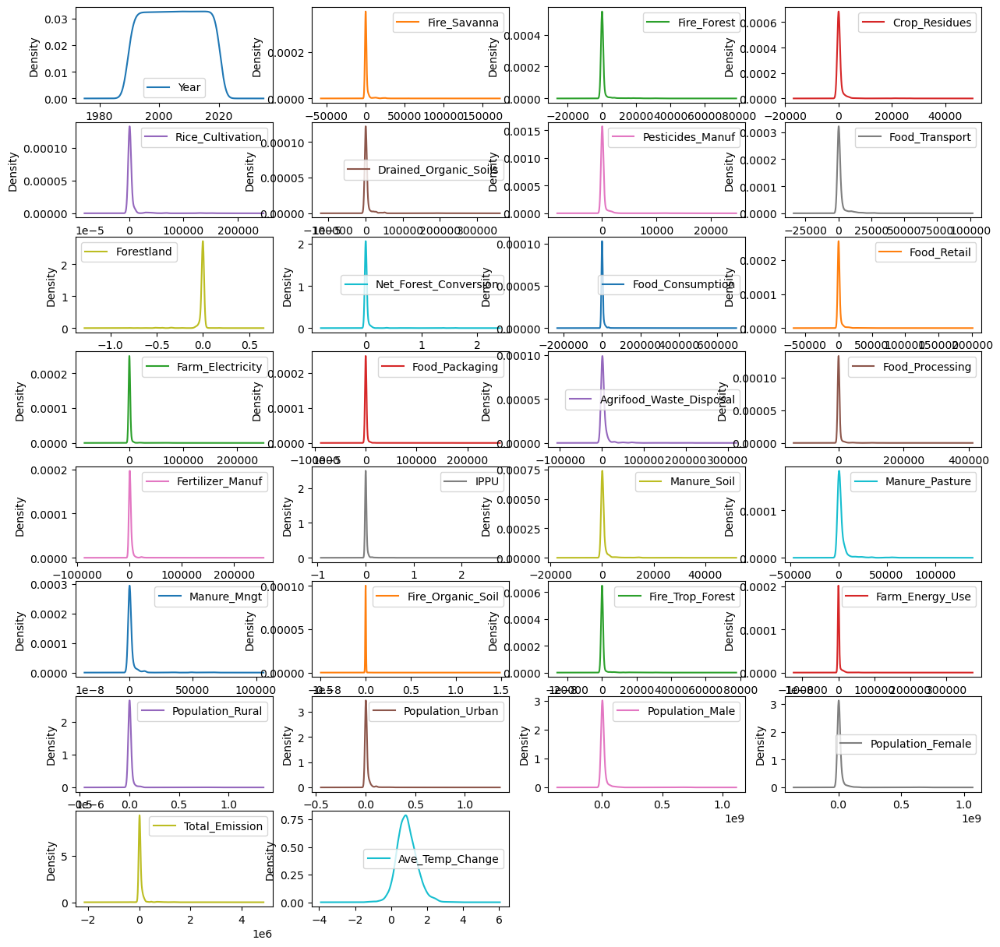

In [26]:
filtered_data.plot(kind='density', subplots=True, layout=(8, 4), sharex=False, figsize=(15, 15));

Have a look at the correlation coefficients of the various features with the average temperature change, as wellas a heatmap.

In [27]:
# Calculating the correlation coefficients
filtered_data_numeric = filtered_data.select_dtypes(include=['number'])
correlation_matrix_filtered = filtered_data_numeric.corr()
correlation_with_target_filtered = correlation_matrix_filtered['Ave_Temp_Change'].sort_values(ascending=False)

# Display the correlations with the target variable
print("Correlation of features with Average Temperature Change:\n", correlation_with_target_filtered)

Correlation of features with Average Temperature Change:
 Ave_Temp_Change            1.000000
Year                       0.544882
Food_Transport             0.072194
Food_Retail                0.069021
IPPU                       0.058539
Food_Processing            0.053068
Food_Consumption           0.050531
Manure_Soil                0.040167
Fertilizer_Manuf           0.036350
Farm_Energy_Use            0.035574
Food_Packaging             0.033886
Manure_Mngt                0.029913
Population_Urban           0.028320
Drained_Organic_Soils      0.028265
Pesticides_Manuf           0.021999
Crop_Residues              0.019573
Total_Emission             0.005574
Farm_Electricity           0.000269
Agrifood_Waste_Disposal   -0.000354
Population_Female         -0.004571
Population_Male           -0.006802
Fire_Organic_Soil         -0.024066
Manure_Pasture            -0.024739
Net_Forest_Conversion     -0.028110
Population_Rural          -0.030087
Rice_Cultivation          -0.035987
Fire_T

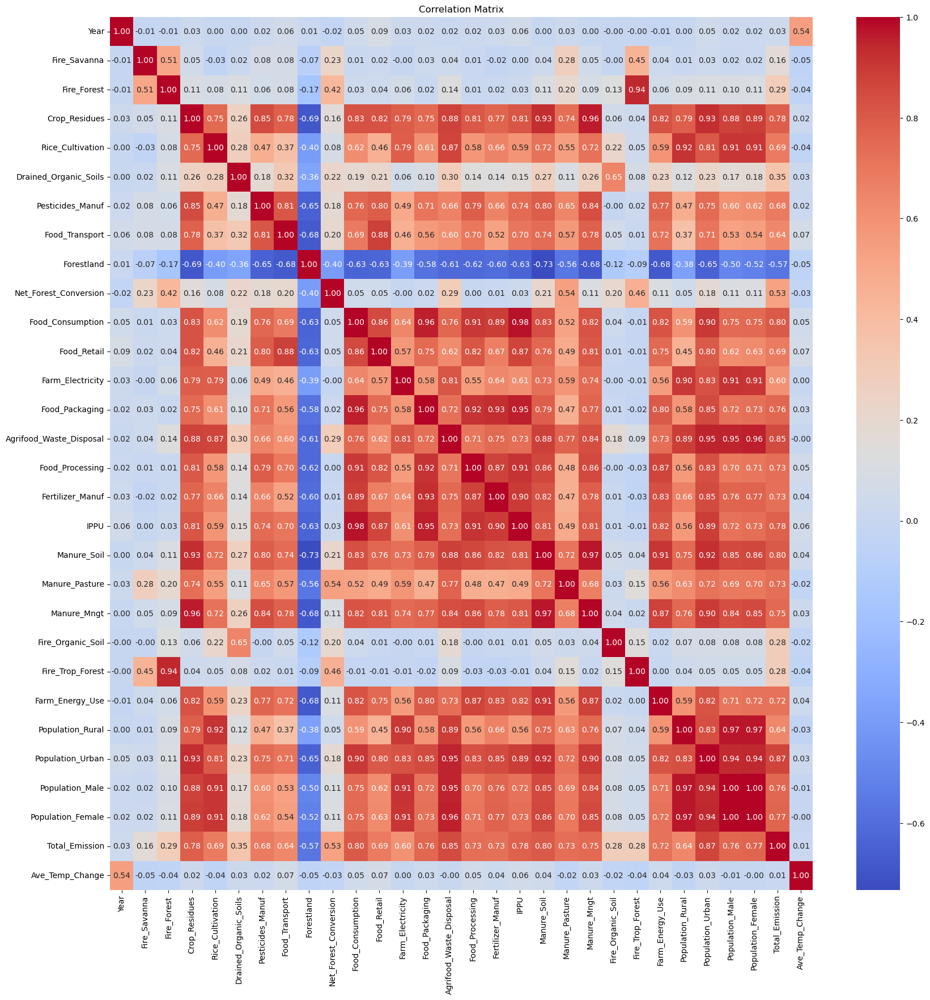

In [28]:
# Heatmap of the correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix_filtered, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

There are correlations between features, but the correlations of features (emission sources) with average temperature change is very low, and doubtful if they can be used to predict changes in temperature.

---
<a href=#five></a>
## **Exploratory Data Analysis on "group_by_region" dataframe**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Explore and visualize the data to uncover patterns, trends, and relationships.
* **Details:** Use statistics and visualizations to explore the data. This may include histograms, box plots, scatter plots, and correlation matrices. Discuss any significant findings.



In [32]:
group_by_region.shape

(680, 31)

In [29]:
group_by_region.describe().T.round(0).applymap(lambda x: f"{int(x):,}" if isinstance(x, (int, float)) else x)

C:\Users\F4688813\AppData\Local\Temp\ipykernel_25452\2148867611.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group_by_region.describe().T.round(0).applymap(lambda x: f"{int(x):,}" if isinstance(x, (int, float)) else x)


,count,mean,std,min,25%,50%,75%,max
Year,680,"2,005",9,"1,990","1,997","2,005","2,013","2,020"
Fire_Savanna,680,"12,103","21,051",0,80,"1,359","16,589","114,617"
Fire_Forest,680,"9,252","18,336",0,29,"1,004","7,213","80,301"
Crop_Residues,680,"6,945","9,242",0,788,"2,663","10,172","34,760"
Rice_Cultivation,680,"36,760","64,505",274,"2,310","12,396","28,162","255,632"
Drained_Organic_Soils,680,"35,709","60,993",0,880,"5,714","36,334","292,028"
Pesticides_Manuf,680,"2,927","4,222",21,441,"1,133","2,966","18,458"
Food_Transport,680,"18,635","19,552",146,"3,044","13,296","25,515","88,306"
Forestland,680,"-149,069","250,643","-1,156,312","-164,895","-18,488","-2,061","61,454"
Net_Forest_Conversion,680,"167,564","400,450",0,"1,480","22,328","110,516","2,134,405"


In [31]:
group_by_region.skew(numeric_only=True) 

Year                      -0.001675
Fire_Savanna               2.113543
Fire_Forest                2.433884
Crop_Residues              1.492800
Rice_Cultivation           2.159310
Drained_Organic_Soils      2.436121
Pesticides_Manuf           2.125773
Food_Transport             1.499290
Forestland                -1.932232
Net_Forest_Conversion      3.595914
Food_Consumption           4.120270
Food_Retail                3.060314
Farm_Electricity           3.612527
Food_Packaging             4.684984
Agrifood_Waste_Disposal    1.719018
Food_Processing            3.082838
Fertilizer_Manuf           3.141520
IPPU                       4.362923
Manure_Soil                1.404678
Manure_Pasture             1.935254
Manure_Mngt                1.304201
Fire_Organic_Soil          7.886012
Fire_Trop_Forest           2.950896
Farm_Energy_Use            3.052856
Population_Rural           2.662612
Population_Urban           2.466219
Population_Male            2.451777
Population_Female          2

**Results:**  the data is still skewed but less so than before aggregating by region.

In [32]:
group_by_region.kurtosis(numeric_only=True) 

Year                       -1.200468
Fire_Savanna                4.037500
Fire_Forest                 5.004897
Crop_Residues               0.927030
Rice_Cultivation            3.154482
Drained_Organic_Soils       5.713282
Pesticides_Manuf            3.467695
Food_Transport              1.910089
Forestland                  3.128693
Net_Forest_Conversion      13.123513
Food_Consumption           21.385521
Food_Retail                11.812038
Farm_Electricity           14.717794
Food_Packaging             23.386930
Agrifood_Waste_Disposal     2.124339
Food_Processing            11.108507
Fertilizer_Manuf           11.809180
IPPU                       22.482609
Manure_Soil                 1.583227
Manure_Pasture              3.747171
Manure_Mngt                 0.690923
Fire_Organic_Soil          74.016012
Fire_Trop_Forest            8.331612
Farm_Energy_Use            12.934083
Population_Rural            6.187633
Population_Urban            6.908746
Population_Male             5.044350
P

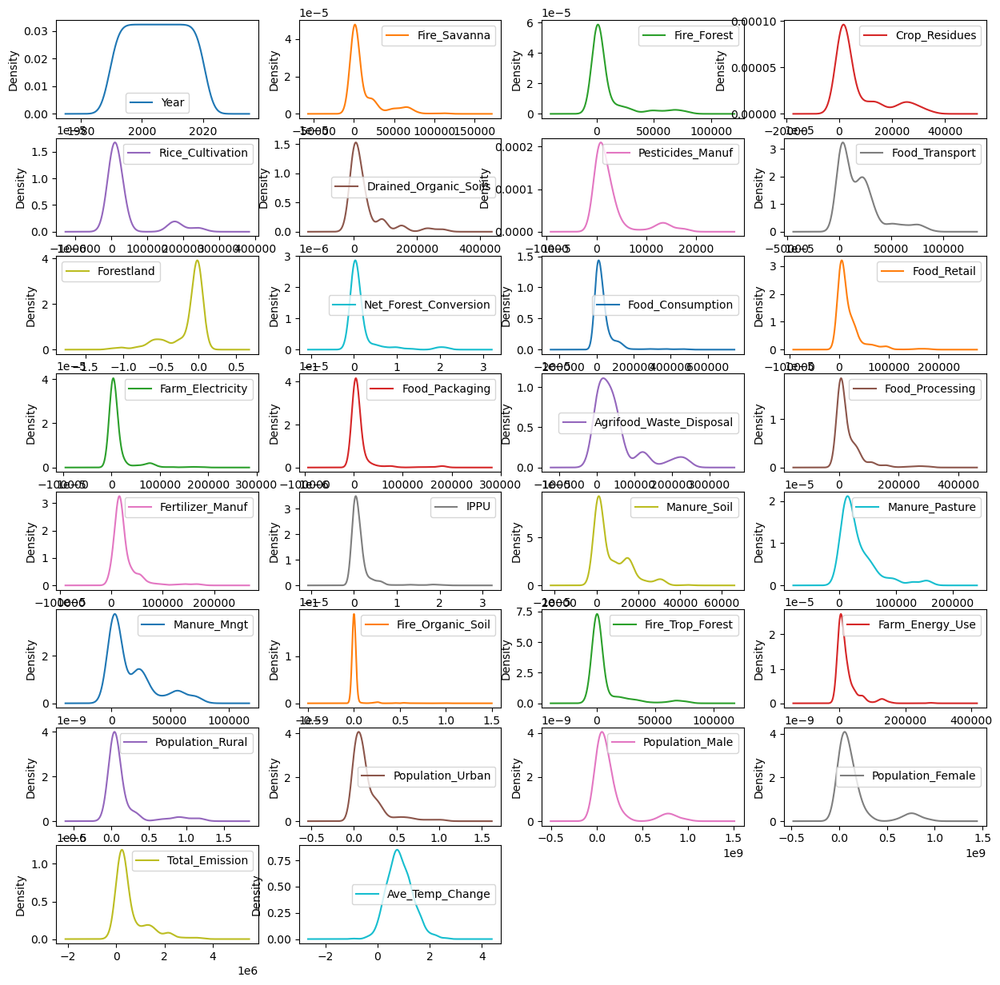

In [36]:
group_by_region.plot(kind='density', subplots=True, layout=(8, 4), sharex=False, figsize=(15, 15));

In [38]:
sns.pairplot(group_by_region_numeric)

In [33]:
# Calculating the correlation coefficients

correlation_matrix_region = group_by_region_numeric.corr()
correlation_with_target_region = correlation_matrix_region['Ave_Temp_Change'].sort_values(ascending=False)

# Display the correlations with the target variable
print("Correlation of features with Average Temperature Change:\n", correlation_with_target_region)

Correlation of features with Average Temperature Change:
 Ave_Temp_Change            1.000000
Year                       0.617940
Food_Retail                0.267354
Food_Transport             0.227831
IPPU                       0.203065
Food_Consumption           0.191046
Food_Processing            0.183465
Fertilizer_Manuf           0.148484
Manure_Soil                0.145472
Population_Urban           0.143665
Manure_Mngt                0.128061
Food_Packaging             0.116701
Crop_Residues              0.107912
Drained_Organic_Soils      0.107644
Farm_Energy_Use            0.095058
Pesticides_Manuf           0.089503
Population_Female          0.060709
Agrifood_Waste_Disposal    0.056331
Population_Male            0.054040
Total_Emission             0.052772
Farm_Electricity           0.042729
Rice_Cultivation          -0.010696
Population_Rural          -0.013133
Fire_Organic_Soil         -0.023512
Manure_Pasture            -0.036517
Fire_Trop_Forest          -0.075469
Fire_F

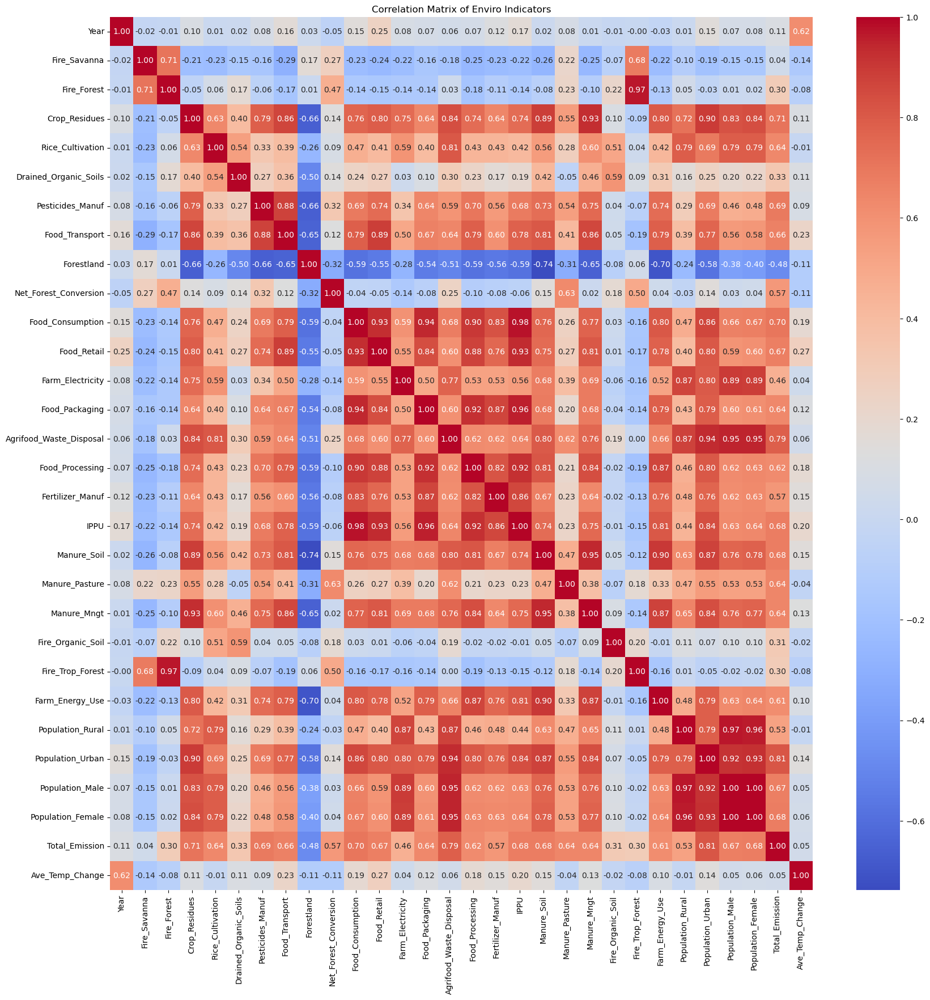

In [38]:
# Heatmap of the correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix_region, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Enviro Indicators')
plt.show()

---
<a href=#six></a>
## **Modeling**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Develop and train predictive or statistical models.
* **Details:** Describe the choice of models, feature selection and engineering processes, and show how the models are trained. Include code for setting up the models and explanations of the model parameters.
---


In [34]:
# Separate the feature and target variables for the "filtered data numeric"  dataset
X_values_filtered = filtered_data_numeric.drop(['Ave_Temp_Change','Year'], axis=1)
y_filtered = filtered_data_numeric['Ave_Temp_Change']

scaler = StandardScaler()
X_scaled_filtered = scaler.fit_transform(X_values_filtered)

scaled_features_filtered_df = pd.DataFrame(X_scaled_filtered, columns=X_values_filtered.columns)
print(scaled_features_filtered_df.head())

   Fire_Savanna  Fire_Forest  Crop_Residues  Rice_Cultivation  \
0     -0.225075    -0.246655      -0.170443         -0.199631   
1     -0.225075    -0.246655      -0.169075         -0.200159   
2     -0.225075    -0.246655      -0.173634         -0.199631   
3     -0.225075    -0.246655      -0.161579         -0.199631   
4     -0.225075    -0.246655      -0.157630         -0.198313   

   Drained_Organic_Soils  Pesticides_Manuf  Food_Transport  Forestland  \
0              -0.221868         -0.221982       -0.327962    0.169549   
1              -0.221868         -0.222057       -0.328310    0.169549   
2              -0.221868         -0.222057       -0.329758    0.169549   
3              -0.221868         -0.222057       -0.329566    0.169549   
4              -0.221868         -0.222057       -0.329635    0.169549   

   Net_Forest_Conversion  Food_Consumption  ...  Manure_Pasture  Manure_Mngt  \
0              -0.169158         -0.179948  ...       -0.204988    -0.219723   
1   

In [35]:
# Separate the feature and target variables for the "group_by_region" dataset
X_values_region = group_by_region_numeric.drop(['Ave_Temp_Change','Year'], axis=1)
y_region = group_by_region_numeric['Ave_Temp_Change']

scaler = StandardScaler()
X_scaled_region = scaler.fit_transform(X_values_region)

scaled_features_region_df = pd.DataFrame(X_scaled_region, columns=X_values_region.columns)
print(scaled_features_region_df.head())

   Fire_Savanna  Fire_Forest  Crop_Residues  Rice_Cultivation  \
0      2.004672    -0.273383      -0.572092         -0.547386   
1     -0.571925    -0.498390      -0.740015         -0.110469   
2     -0.519588    -0.310809      -0.558821         -0.562672   
3      1.649587     2.013299      -0.563151         -0.336304   
4     -0.536872    -0.443659       2.031723          2.340236   

   Drained_Organic_Soils  Pesticides_Manuf  Food_Transport  Forestland  \
0              -0.499851         -0.482309       -0.555712    0.440444   
1              -0.580734         -0.527263       -0.752851    0.516424   
2              -0.569478         -0.461213       -0.420429    0.586955   
3               0.076151         -0.636813       -0.890460    0.559633   
4              -0.069420          1.291611        1.270337   -1.314990   

   Net_Forest_Conversion  Food_Consumption  ...  Manure_Pasture  Manure_Mngt  \
0              -0.269870         -0.450617  ...        0.344971    -0.403190   
1   

In [46]:
# Separate the feature and target variables for the "group_by_region" dataset
df_aggregate_num = df_aggregate.select_dtypes(include=['number'])
X_values_agg = df_aggregate_num.drop(['Ave_Temp_Change','Year'], axis=1)
y_agg = df_aggregate_num['Ave_Temp_Change']

scaler = StandardScaler()
X_scaled_agg = scaler.fit_transform(X_values_agg)

scaled_features_agg_df = pd.DataFrame(X_scaled_agg, columns=X_values_agg.columns)
print(scaled_features_agg_df.head())

   Rice_Cultivation  Drained_Organic_Soils      IPPU  Population_Rural  \
0         -0.199631              -0.221868 -0.170841         -0.068447   
1         -0.200159              -0.221868 -0.170754         -0.060776   
2         -0.199631              -0.221868 -0.170691         -0.050574   
3         -0.199631              -0.221868 -0.170950         -0.039074   
4         -0.198313              -0.221868 -0.171184         -0.027980   

   Population_Urban  Total_Emission   Forests    Fires  Farming_Other  \
0         -0.223678       -0.285273 -0.043745 -0.15405      -0.218389   
1         -0.220507       -0.284619 -0.043745 -0.15405      -0.218341   
2         -0.216338       -0.284449 -0.043745 -0.15405      -0.219113   
3         -0.211627       -0.284385 -0.043745 -0.15405      -0.217370   
4         -0.207025       -0.283691 -0.043745 -0.15405      -0.216830   

     Manure      Food  Population_Total  
0 -0.224587 -0.219202         -0.138752  
1 -0.218387 -0.219057         -0

In [49]:
# Separate the feature and target variables for the "group_by_region" dataset

X_values_year = group_by_year.drop(['Ave_Temp_Change','Year'], axis=1)
y_year = group_by_year['Ave_Temp_Change']

scaler = StandardScaler()
X_scaled_year = scaler.fit_transform(X_values_year)

scaled_features_year_df = pd.DataFrame(X_scaled_year, columns=X_values_year.columns)
print(scaled_features_year_df.head())

   Fire_Savanna  Fire_Forest  Crop_Residues  Rice_Cultivation  \
0     -0.008512     0.002858      -1.085877         -1.772181   
1     -0.008512     0.002858      -1.282835         -1.635649   
2     -0.008512     0.002858      -1.066677         -1.148261   
3     -0.008512     0.002858      -1.203697         -1.430808   
4     -0.008512     0.002858      -1.098107         -1.237581   

   Drained_Organic_Soils  Pesticides_Manuf  Food_Transport  Forestland  \
0              -1.274284         -1.836843       -1.448119   -0.410476   
1              -1.274284         -1.896237       -1.342641   -0.410476   
2              -1.274284         -1.560191       -1.309100   -0.410476   
3              -1.258280         -1.604836       -1.312992   -0.410476   
4              -1.270505         -1.176225       -1.279453   -0.410476   

   Net_Forest_Conversion  Food_Consumption  ...  Manure_Pasture  Manure_Mngt  \
0               1.140219         -1.588423  ...       -1.596613     0.205893   
1   

In [36]:

# Split the data for the filtered dataset
X_train_filtered, X_test_filtered, y_train_filtered, y_test_filtered = train_test_split(X_scaled_filtered, y_filtered, test_size=0.2, random_state=42)

In [37]:

# Split the data for the data summarised by region
X_train_region, X_test_region, y_train_region, y_test_region = train_test_split(X_scaled_region, y_region, test_size=0.2, random_state=42)

In [47]:

# Split the data for the data summarised by aggregate
X_train_agg, X_test_agg, y_train_agg, y_test_agg = train_test_split(X_scaled_agg, y_agg, test_size=0.2, random_state=42)

In [50]:

# Split the data for the data summarised by aggregate
X_train_year, X_test_year, y_train_year, y_test_year = train_test_split(X_scaled_year, y_year, test_size=0.2, random_state=42)

**MULTIPLE LINEAR REGRESSION (Filtered data)**

In [38]:
mlr_regressor_filtered = LinearRegression()
mlr_regressor_filtered.fit(X_train_filtered, y_train_filtered)

# Evaluate the model
y_pred_filtered_mlr = mlr_regressor_filtered.predict(X_test_filtered)
filtered_r2_mlr = r2_score(y_test_filtered, y_pred_filtered_mlr)
filtered_MSE_mlr = mean_squared_error(y_test_filtered, y_pred_filtered_mlr)
filtered_RMSE_mlr = np.sqrt(filtered_MSE_mlr)

print(f"R-squared value on the test set: {filtered_r2_mlr}")
print(f"Mean Squared Error:  {filtered_MSE_mlr}")
print(f"Root Mean Squared Error:  {filtered_RMSE_mlr}")


R-squared value on the test set: 0.025435893801930454
Mean Squared Error:  0.29418145781197763
Root Mean Squared Error:  0.5423849719636207


**MULTIPLE LINEAR REGRESSION (Group by Region)**

In [39]:
mlr_regressor_region = LinearRegression()
mlr_regressor_region.fit(X_train_region, y_train_region)

# Evaluate the model
y_pred_region_mlr = mlr_regressor_region.predict(X_test_region)
region_r2_mlr = r2_score(y_test_region, y_pred_region_mlr)
region_MSE_mlr = mean_squared_error(y_test_region, y_pred_region_mlr)
region_RMSE_mlr = np.sqrt(region_MSE_mlr)

print(f"R-squared value on the test set: {region_r2_mlr}")
print(f"Mean Squared Error:  {region_MSE_mlr}")
print(f"Root Mean Squared Error:  {region_RMSE_mlr}")

R-squared value on the test set: 0.10967046098911382
Mean Squared Error:  0.18056582190322118
Root Mean Squared Error:  0.4249303730062387


**LASSO (filtered)**

In [40]:
# LASSO regression model with cross-validation
lasso_regressor_filtered = Lasso(alpha=0.01, random_state=42)
lasso_regressor_filtered.fit(X_train_filtered, y_train_filtered)

# Evaluate the model
y_pred_lasso_filtered = lasso_regressor_filtered.predict(X_test_filtered)
r2_lasso_filtered = r2_score(y_test_filtered, y_pred_lasso_filtered)
MSE_lasso_filtered = mean_squared_error(y_test_filtered, y_pred_lasso_filtered)
RMSE_lasso_filtered = np.sqrt(MSE_lasso_filtered)
features_used_filtered = np.sum(lasso_regressor_filtered.coef_ != 0)

#print(f"Optimal regularisation parameter: {lasso_regressor_filtered.alpha_}")
print(f"R-squared value on the test set: {r2_lasso_filtered}")
print(f"Mean Squared Error:  {MSE_lasso_filtered}")
print(f"Root Mean Squared Error:  {RMSE_lasso_filtered}")
print(f"Number of features used: {features_used_filtered}")

R-squared value on the test set: 0.009744390429398675
Mean Squared Error:  0.2989180875606366
Root Mean Squared Error:  0.5467340190262873
Number of features used: 7


**LASSO (region)**

In [41]:
# LASSO regression model with cross-validation
lasso_regressor_region = Lasso(alpha=0.01, random_state=42)
lasso_regressor_region.fit(X_train_region, y_train_region)

# Evaluate the model
y_pred_lasso_region = lasso_regressor_region.predict(X_test_region)
r2_lasso_region = r2_score(y_test_region, y_pred_lasso_region)
MSE_lasso_region = mean_squared_error(y_test_region, y_pred_lasso_region)
RMSE_lasso_region = np.sqrt(MSE_lasso_region)
features_used_region = np.sum(lasso_regressor_region.coef_ != 0)

#print(f"Optimal regularisation parameter: {lasso_regressor_region.alpha_}")
print(f"R-squared value on the test set: {r2_lasso_region}")
print(f"Mean Squared Error:  {MSE_lasso_region}")
print(f"Root Mean Squared Error:  {RMSE_lasso_region}")
print(f"Number of features used: {features_used_region}")

R-squared value on the test set: 0.06946421469700703
Mean Squared Error:  0.18871996437438188
Root Mean Squared Error:  0.4344191114285626
Number of features used: 17


**DECISION TREES (filtered)**

In [42]:
dec_tree_filtered = DecisionTreeRegressor(max_depth=4, random_state=42)
dec_tree_filtered.fit(X_train_filtered, y_train_filtered)

# Evaluate the model
y_pred_dt_filtered = dec_tree_filtered.predict(X_test_filtered)
r2_dt_filtered = r2_score(y_test_filtered, y_pred_dt_filtered)
MSE_dt_filtered = mean_squared_error(y_test_filtered, y_pred_dt_filtered)
RMSE_dt_filtered = np.sqrt(MSE_dt_filtered)

print(f"R-squared value on the test set: {r2_dt_filtered}")
print(f"Mean Squared Error:  {MSE_dt_filtered}")
print(f"Mean Squared Error:  {RMSE_dt_filtered}")


R-squared value on the test set: 0.1460181923427636
Mean Squared Error:  0.25778254249644494
Mean Squared Error:  0.5077228993224995


**DECISION TREES (region)**

In [43]:
dec_tree_region = DecisionTreeRegressor(max_depth=4, random_state=42)
dec_tree_region.fit(X_train_region, y_train_region)

# Evaluate the model
y_pred_dt_region = dec_tree_region.predict(X_test_region)
r2_dt_region = r2_score(y_test_region, y_pred_dt_region)
MSE_dt_region = mean_squared_error(y_test_region, y_pred_dt_region)
RMSE_dt_region = np.sqrt(MSE_dt_region)

print(f"R-squared value on the test set: {r2_dt_region}")
print(f"Mean Squared Error:  {MSE_dt_region}")
print(f"Mean Squared Error:  {RMSE_dt_region}")

R-squared value on the test set: 0.039109794925492936
Mean Squared Error:  0.19487607906482327
Mean Squared Error:  0.4414477081884368


**RANDOM FORESTS (filtered)**

In [44]:
# Initialise the RandomForestRegressor
rf_filtered = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model
rf_filtered.fit(X_train_filtered, y_train_filtered)

# Evaluate the model
y_pred_rf_filtered = rf_filtered.predict(X_test_filtered)
r2_rf_filtered = r2_score(y_test_filtered, y_pred_rf_filtered)
MSE_rf_filtered = mean_squared_error(y_test_filtered, y_pred_rf_filtered)
RMSE_rf_filtered = np.sqrt(MSE_rf_filtered)

print(f"R-squared value on the test set: {r2_rf_filtered}")
print(f"Mean Squared Error:  {MSE_rf_filtered}")
print(f"Root Mean Squared Error:  {RMSE_rf_filtered}")


R-squared value on the test set: 0.4862605585881865
Mean Squared Error:  0.1550771435648609
Root Mean Squared Error:  0.3937983539387397


**RANDOM FOREST (Region)**

In [45]:
# Initialise the RandomForestRegressor
rf_region = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model
rf_region.fit(X_train_region, y_train_region)

# Evaluate the model
y_pred_rf_region = rf_region.predict(X_test_region)
r2_rf_region = r2_score(y_test_region, y_pred_rf_region)
MSE_rf_region = mean_squared_error(y_test_region, y_pred_rf_region)
RMSE_rf_region = np.sqrt(MSE_rf_region)

print(f"R-squared value on the test set: {r2_rf_region}")
print(f"Mean Squared Error:  {MSE_rf_region}")
print(f"Root Mean Squared Error:  {RMSE_rf_region}")

R-squared value on the test set: 0.37910088521569174
Mean Squared Error:  0.12592321614372526
Root Mean Squared Error:  0.35485661349864295


In [48]:
# Initialise the RandomForestRegressor
rf_agg = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model
rf_agg.fit(X_train_agg, y_train_agg)

# Evaluate the model
y_pred_rf_agg = rf_agg.predict(X_test_agg)
r2_rf_agg = r2_score(y_test_agg, y_pred_rf_agg)
MSE_rf_agg = mean_squared_error(y_test_agg, y_pred_rf_agg)
RMSE_rf_agg = np.sqrt(MSE_rf_agg)

print(f"R-squared value on the test set: {r2_rf_agg}")
print(f"Mean Squared Error:  {MSE_rf_agg}")
print(f"Root Mean Squared Error:  {RMSE_rf_agg}")

R-squared value on the test set: 0.47791839047595586
Mean Squared Error:  0.15759530646554734
Root Mean Squared Error:  0.3969827533603284


In [51]:
# Initialise the RandomForestRegressor
rf_year = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model
rf_year.fit(X_train_year, y_train_year)

# Evaluate the model
y_pred_rf_year = rf_filtered.predict(X_test_year)
r2_rf_year = r2_score(y_test_year, y_pred_rf_year)
MSE_rf_year = mean_squared_error(y_test_year, y_pred_rf_year)
RMSE_rf_year= np.sqrt(MSE_rf_year)

print(f"R-squared value on the test set: {r2_rf_year}")
print(f"Mean Squared Error:  {MSE_rf_year}")
print(f"Root Mean Squared Error:  {RMSE_rf_year}")


R-squared value on the test set: -0.317501997715663
Mean Squared Error:  0.07286725198269715
Root Mean Squared Error:  0.26993934871133024


---
<a href=#seven></a>
## **Evaluation and Validation**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Evaluate and validate the effectiveness and accuracy of the models.
* **Details:** Present metrics used to evaluate the models, such as accuracy, precision, recall, F1-score, etc. Discuss validation techniques employed, such as cross-validation or train/test split.

The random forest regression model performed the best out of the 4 models.  Interestingly the random forest model based on the filtered data presented better r2 scores, but worse RMSE scores.

Use the Lasso model with cross validation to reduce the number of features used in the models and rerun to compare.

In [52]:
# LASSO regression model with cross-validation
lasso_regressor_filtered_cv = LassoCV(cv=5, random_state=42, max_iter=50000)
lasso_regressor_filtered_cv.fit(X_train_filtered, y_train_filtered)

# Evaluate the model
y_pred_lasso_filtered = lasso_regressor_filtered_cv.predict(X_test_filtered)
r2_lasso_filtered = r2_score(y_test_filtered, y_pred_lasso_filtered)
MSE_lasso_filtered = mean_squared_error(y_test_filtered, y_pred_lasso_filtered)
RMSE_lasso_filtered = np.sqrt(MSE_lasso_filtered)
features_used_filtered = np.sum(lasso_regressor_filtered_cv.coef_ != 0)

print(f"Optimal regularisation parameter: {lasso_regressor_filtered_cv.alpha_}")
print(f"R-squared value on the test set: {r2_lasso_filtered}")
print(f"Mean Squared Error:  {MSE_lasso_filtered}")
print(f"Root Mean Squared Error:  {RMSE_lasso_filtered}")
print(f"Number of features used: {features_used_filtered}")

Optimal regularisation parameter: 0.0006003121461296272
R-squared value on the test set: 0.024797545528094767
Mean Squared Error:  0.2943741493184619
Root Mean Squared Error:  0.542562576407977
Number of features used: 21


In [53]:
# Extract coefficient from model
coeff_filtered = pd.DataFrame(lasso_regressor_filtered_cv.coef_, X_values_filtered.columns, columns=['Coefficient']).sort_values('Coefficient')
coeff_filtered

,Coefficient
Farm_Energy_Use,-0.085687
Manure_Mngt,-0.081815
Population_Rural,-0.058147
Pesticides_Manuf,-0.054897
Fire_Forest,-0.034560
Food_Packaging,-0.030548
Rice_Cultivation,-0.027956
Fire_Organic_Soil,-0.025510
Net_Forest_Conversion,-0.024712
Manure_Pasture,-0.019220


In [60]:
# Separate the feature and target variables for the "filtered data numeric"  dataset
X_values_filtered_fewer = filtered_data_numeric.drop(['Ave_Temp_Change','Total_Emission', 'Population_Male', 'Population_Female','Agrifood_Waste_Disposal','Food_Retail','Food_Consumption',
                                                      'Farm_Electricity','Year'], axis=1)
y_filtered = filtered_data_numeric['Ave_Temp_Change']

scaler = StandardScaler()
X_scaled_filtered_fewer = scaler.fit_transform(X_values_filtered_fewer)
# Split the data for the filtered dataset
X_train_filtered_f, X_test_filtered_f, y_train_filtered_f, y_test_filtered_f = train_test_split(X_scaled_filtered_fewer, y_filtered, 
                                                                                                                test_size=0.2, random_state=42)

In [61]:
# Initialise the RandomForestRegressor
rf_filtered_f = RandomForestRegressor(n_estimators=100, random_state=42,max_depth=15)

# Fit the model
rf_filtered_f.fit(X_train_filtered_f, y_train_filtered_f)

# Evaluate the model
y_pred_rf_filtered_f = rf_filtered_f.predict(X_test_filtered_f)
r2_rf_filtered_f = r2_score(y_test_filtered_f, y_pred_rf_filtered_f)
MSE_rf_filtered_f = mean_squared_error(y_test_filtered_f, y_pred_rf_filtered_f)
RMSE_rf_filtered_f = np.sqrt(MSE_rf_filtered_f)

print(f"R-squared value on the test set: {r2_rf_filtered_f}")
print(f"Mean Squared Error:  {MSE_rf_filtered_f}")
print(f"Root Mean Squared Error:  {RMSE_rf_filtered_f}")

R-squared value on the test set: 0.4694648389210938
Mean Squared Error:  0.16014709151927742
Root Mean Squared Error:  0.40018382216086323


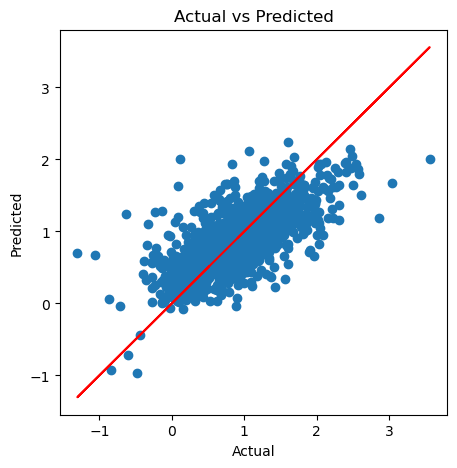

In [62]:
# Create figure and axes
f, ax = plt.subplots(figsize=(5,5))

# Plot actual vs. predicted values on axes
ax.set_title('Actual vs Predicted')
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.scatter(y_test_filtered,y_pred_rf_filtered)
ax.plot(y_test_filtered,y_test_filtered,'r')
plt.show()

In [63]:
X_values_filtered


,Fire_Savanna,Fire_Forest,Crop_Residues,Rice_Cultivation,Drained_Organic_Soils,Pesticides_Manuf,Food_Transport,Forestland,Net_Forest_Conversion,Food_Consumption,...,Manure_Pasture,Manure_Mngt,Fire_Organic_Soil,Fire_Trop_Forest,Farm_Energy_Use,Population_Rural,Population_Urban,Population_Male,Population_Female,Total_Emission
0,14.7237,0.0557,205.6077,686.0000,0.0,11.807483,63.1152,-2388.8030,0.0000,79.0851,...,1590.5319,319.1763,0.0,0.0,0.0000,9655167.0,2593947.0,5348387.0,5346409.0,2198.963539
1,14.7237,0.0557,209.4971,678.1600,0.0,11.712073,61.2125,-2388.8030,0.0000,80.4885,...,1657.2364,342.3079,0.0,0.0,0.0000,10230490.0,2763167.0,5372959.0,5372208.0,2323.876629
2,14.7237,0.0557,196.5341,686.0000,0.0,11.712073,53.3170,-2388.8030,0.0000,80.7692,...,1653.5068,349.1224,0.0,0.0,0.0000,10995568.0,2985663.0,6028494.0,6028939.0,2356.304229
3,14.7237,0.0557,230.8175,686.0000,0.0,11.712073,54.3617,-2388.8030,0.0000,85.0678,...,1642.9623,352.2947,0.0,0.0,0.0000,11858090.0,3237009.0,7003641.0,7000119.0,2368.470529
4,14.7237,0.0557,242.0494,705.6000,0.0,11.712073,53.9874,-2388.8030,0.0000,88.8058,...,1689.3593,367.6784,0.0,0.0,0.0000,12690115.0,3482604.0,7733458.0,7722096.0,2500.768729
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6960,1190.0089,232.5068,70.9451,7.4088,0.0,75.000000,251.1465,76500.2982,10662.4408,251.2681,...,2721.1459,282.5994,0.0,0.0,417.3150,10934468.0,5215894.0,6796658.0,7656047.0,98491.026347
6961,1431.1407,131.1324,108.6262,7.9458,0.0,67.000000,255.7975,76500.2982,10662.4408,203.1236,...,2744.8763,255.5900,0.0,0.0,398.1644,11201138.0,5328766.0,6940631.0,7810471.0,97159.311553
6962,1557.5830,221.6222,109.9835,8.1399,0.0,66.000000,327.0897,76500.2982,10662.4408,211.1539,...,2790.0949,257.2735,0.0,0.0,465.7735,11465748.0,5447513.0,7086002.0,7966181.0,97668.308205
6963,1591.6049,171.0262,45.4574,7.8322,0.0,73.000000,290.1893,76500.2982,10662.4408,228.6381,...,2828.7215,267.5224,0.0,0.0,444.2335,11725970.0,5571525.0,7231989.0,8122618.0,98988.062799


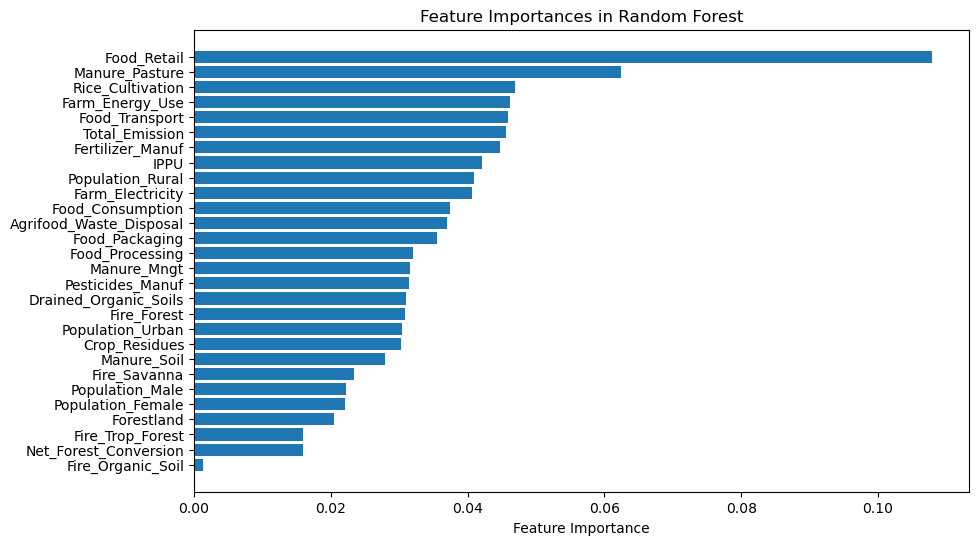

In [64]:
# Get feature importances
importances = rf_filtered.feature_importances_

# Sort features by importance
indices = np.argsort(importances)[::-1]

# Assuming your features are in a pandas DataFrame, X_train_filtered_f
feature_names = X_values_filtered.columns  # Get feature names from DataFrame

# Create a bar chart with actual feature names
plt.figure(figsize=(10, 6))
plt.barh(range(len(feature_names)), importances[indices], align='center')
plt.yticks(range(len(feature_names)), feature_names[indices])  # Use actual feature names
plt.xlabel('Feature Importance')
plt.title('Feature Importances in Random Forest')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()



Mean MSE: 0.29328271956390517
Standard Deviation of MSE: 0.024744435749170283


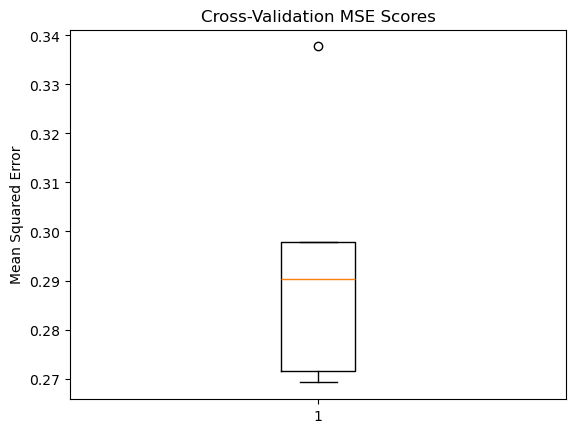

In [65]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate

# Perform 5-fold cross-validation
cv_scores = cross_val_score(rf_filtered, X_values_filtered, y_filtered, cv=5, scoring='neg_mean_squared_error')

# Convert to positive MSE (since cross_val_score returns negative values for MSE)
mse_scores = -cv_scores

# Calculate mean and standard deviation
mean_mse = np.mean(mse_scores)
std_mse = np.std(mse_scores)

# Print results
print(f'Mean MSE: {mean_mse}')
print(f'Standard Deviation of MSE: {std_mse}')

# Visualize the cross-validation results
plt.boxplot(mse_scores)
plt.title('Cross-Validation MSE Scores')
plt.ylabel('Mean Squared Error')
plt.show()



---
<a href=#eight></a>
## **Final Model**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Present the final model and its performance.
* **Details:** Highlight the best-performing model and discuss its configuration, performance, and why it was chosen over others.
---


In [ ]:
#Please use code cells to code in and do not forget to comment your code.

---
<a href=#nine></a>
## **Conclusion and Future Work**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Summarize the findings and discuss future directions.
* **Details:** Conclude with a summary of the results, insights gained, limitations of the study, and suggestions for future projects or improvements in methodology or data collection.
---


In [ ]:
#Please use code cells to code in and do not forget to comment your code.

---
<a href=#ten></a>
## **References**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Provide citations and sources of external content.
* **Details:** List all the references and sources consulted during the project, including data sources, research papers, and documentation for tools and libraries used.
---

In [ ]:
#Please use code cells to code in and do not forget to comment your code.

## Additional Sections to Consider

* ### Appendix: 
For any additional code, detailed tables, or extended data visualizations that are supplementary to the main content.

* ### Contributors: 
David Harrison
